In [5]:
# Import necessary libraries;
import numpy as np
from numpy import mean
from numpy import std


import pandas as pd

import matplotlib.pyplot as plt
from scipy import stats

# use seaborn plotting defaults
import seaborn as sns; sns.set_style('white')

from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)


from mpl_toolkits.mplot3d import Axes3D
from numpy import genfromtxt
import sklearn.metrics as metrics
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.datasets import load_digits, make_blobs
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, plot_confusion_matrix
from sklearn.model_selection import KFold, train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler, MaxAbsScaler, StandardScaler 
from sklearn.preprocessing import RobustScaler, Normalizer, QuantileTransformer, PowerTransformer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score
from sklearn import tree
import plotly.graph_objects as go
import plotly.express as px

In [6]:
leagueData = pd.read_csv('LeagueMatches.csv')
del leagueData['Unnamed: 0']
del leagueData['matchId']
leagueData.head()

,blue_win,blueGold,blueMinionsKilled,blueJungleMinionsKilled,blueAvgLevel,redGold,redMinionsKilled,redJungleMinionsKilled,redAvgLevel,blueChampKills,blueHeraldKills,blueDragonKills,blueTowersDestroyed,redChampKills,redHeraldKills,redDragonKills,redTowersDestroyed
0,0,24575.0,349.0,89.0,8.6,25856.0,346.0,80.0,9.2,6.0,1.0,0.0,1.0,12.0,2.0,0.0,1.0
1,0,27210.0,290.0,36.0,9.0,28765.0,294.0,92.0,9.4,20.0,0.0,0.0,0.0,19.0,2.0,0.0,0.0
2,1,32048.0,346.0,92.0,9.4,25305.0,293.0,84.0,9.4,17.0,3.0,0.0,0.0,11.0,0.0,0.0,4.0
3,0,20261.0,223.0,60.0,8.2,30429.0,356.0,107.0,9.4,7.0,0.0,0.0,3.0,16.0,3.0,0.0,0.0
4,1,30217.0,376.0,110.0,9.8,23889.0,334.0,60.0,8.8,16.0,3.0,0.0,0.0,8.0,0.0,0.0,2.0


In [20]:
print(leagueData.shape)

X = leagueData.iloc[:,1:17].values
y = leagueData.iloc[:,0].values

print(X.shape)
print(y.shape)
print(y)
#To be used for validation purposes with best model for each trial 5000 train and 45000 test
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size = 43000, random_state=777)
import warnings
warnings.filterwarnings('ignore')


fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = leagueData['blue_win'],
                   colorscale = 'RdBu',
                   cauto = True),
             dimensions = list([
             dict(range = [leagueData['blueGold'].min() ,leagueData['blueGold'].max()],
                 label = "Gold", values = leagueData['blueGold']),
             dict(range = [leagueData['blueMinionsKilled'].min() ,leagueData['blueMinionsKilled'].max()],
                 label = 'Minions Killed', values = leagueData['blueMinionsKilled']),
             dict(range = [leagueData['blueJungleMinionsKilled'].min() ,leagueData['blueJungleMinionsKilled'].max()],
                 label = 'Jungle Minions Killed', values = leagueData['blueJungleMinionsKilled']),
             dict(range = [leagueData['blueAvgLevel'].min() ,leagueData['blueAvgLevel'].max()],
                 label = 'Average Levels', values = leagueData['blueAvgLevel']),
             dict(range = [leagueData['blueChampKills'].min() ,leagueData['blueChampKills'].max()],
                 label = 'Champions Killed', values = leagueData['blueChampKills']),
             dict(range = [leagueData['blueHeraldKills'].min() ,leagueData['blueHeraldKills'].max()],
                 label = 'Herald Kills', values = leagueData['blueHeraldKills']),
             dict(range = [leagueData['blueDragonKills'].min() ,leagueData['blueDragonKills'].max()],
                 label = 'Dragon Kills', values = leagueData['blueDragonKills']),
             dict(range = [leagueData['blueTowersDestroyed'].min() ,leagueData['blueTowersDestroyed'].max()],
                 label = 'Towers Destroyed', values = leagueData['blueTowersDestroyed']),
             dict(range = [leagueData['blue_win'].min() ,leagueData['blue_win'].max()],
                 label = 'Win', values = leagueData['blue_win'])])
    )
)
               
fig.show()

(48651, 17)
(48651, 16)
(48651,)
[0 0 1 ... 0 1 0]


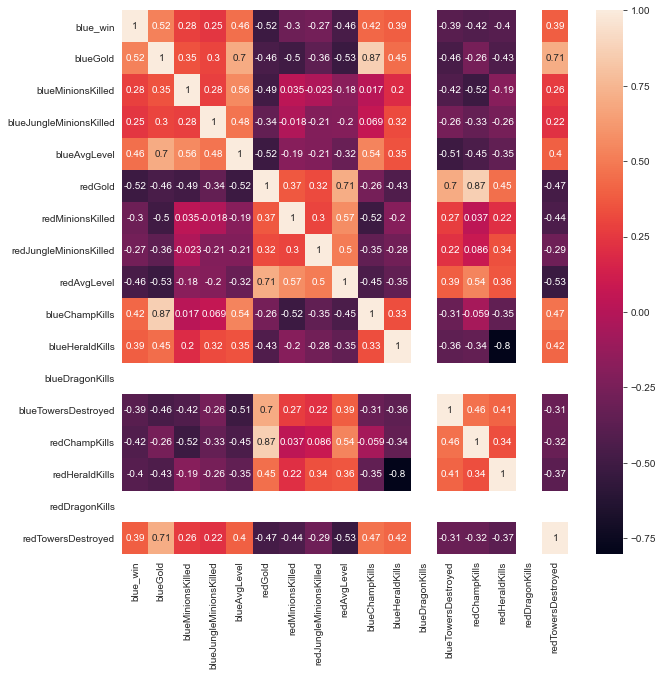

In [31]:
corrMatrix = leagueData.corr()
fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(corrMatrix, annot=True)


plt.show()

# LOGISTIC REGRESSION TRIAL ONE ON LEAGUE OF LEGENDS DATASET

In [267]:
import warnings
warnings.filterwarnings('ignore')

ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = leagueData.sample(n = 5000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,1:17].values
    ySet = random5000DataPoints.iloc[:,0].values
    # Run GridSearch to find best hyperparameters per 5000 data points 
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro', 'f1_micro','precision_micro','roc_auc_ovo','jaccard','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_1 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL ONE RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0966s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done  19 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    2.5s


---------------------------------TRIAL ONE RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 194 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 214 out of 245 | elapsed:    2.7s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 239 out of 245 | elapsed:    2.7s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:    2.7s finished


In [268]:
TRIAL_1.cv_results_

{'mean_fit_time': array([0.02522149, 0.0513442 , 0.06235356, 0.04603963, 0.04764118,
        0.0561481 , 0.06895876, 0.05074325, 0.09157877, 0.06715784,
        0.08797598, 0.07106109, 0.07936769, 0.06905923, 0.08297143,
        0.06895986, 0.10128713, 0.08797565, 0.02352037, 0.02932529,
        0.02762442, 0.03212714, 0.04023557, 0.03763361, 0.03402977,
        0.03743296, 0.0346293 , 0.04003496, 0.08497281, 0.05224433,
        0.00530457, 0.03913493, 0.04253712, 0.04864249, 0.05674896,
        0.06162596, 0.05965176, 0.06845827, 0.07066031, 0.06615744,
        0.0157135 , 0.01621499, 0.02051821, 0.01981702, 0.02101946,
        0.02261968, 0.02372336, 0.02071834, 0.01691246]),
 'std_fit_time': array([0.00116734, 0.00917596, 0.00699637, 0.00318081, 0.00274825,
        0.03173007, 0.01535728, 0.00238077, 0.01122152, 0.00653561,
        0.0125825 , 0.0053338 , 0.00673315, 0.00813089, 0.0072756 ,
        0.00535664, 0.01003159, 0.01393469, 0.00540852, 0.00404865,
        0.00399637, 0.002

In [269]:
print("---------------------------------TRIAL ONE NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_1.cv_results_['rank_test_neg_log_loss']
TRIAL_1.cv_results_['params'][ np.argmin(TRIAL_1.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL ONE NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l2',
 'classifier__solver': 'lbfgs'}

In [259]:
print("---------------------------------TRIAL ONE F1 RESULTS ---------------------------------------------")
TRIAL_1.cv_results_['rank_test_f1_micro']
TRIAL_1.cv_results_['params'][ np.argmin(TRIAL_1.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL ONE F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l2',
 'classifier__solver': 'liblinear'}

In [260]:
print("---------------------------------TRIAL ONE ROC AUC RESULTS ---------------------------------------------")
TRIAL_1.cv_results_['rank_test_roc_auc_ovo']
TRIAL_1.cv_results_['params'][ np.argmin(TRIAL_1.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL ONE ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l1',
 'classifier__solver': 'saga'}

In [265]:
print("---------------------------------TRIAL ONE JACCARD SCORE RESULTS ---------------------------------------------")
TRIAL_2.cv_results_['rank_test_jaccard']
TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_jaccard']) ]

---------------------------------TRIAL ONE JACCARD SCORE RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.0001,
 'classifier__penalty': 'l2',
 'classifier__solver': 'saga'}

In [14]:
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
bestF1LR233 = LogisticRegression(C = 0.1, penalty = 'l2', solver = 'lbfgs', n_jobs = -1)
bestF1LR233.fit(X_train,y_train)
y_pred3_233 = bestF1LR233.predict(X_test)
print('Accuracy of Trial 1 Logistic Regression using best NEG LOG LOSS hyperparameters :'
      + str(accuracy_score(y_test,y_pred3_233)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, LR_Trial 1
bestF1LR1 = LogisticRegression(C = 0.01, penalty = 'l2', solver = 'liblinear', n_jobs = -1)
bestF1LR1.fit(X_train,y_train)
y_pred3_1 = bestF1LR1.predict(X_test)
print('Accuracy of Trial 1 Logistic Regression using best F1 hyperparameters :'
      + str(accuracy_score(y_test,y_pred3_1)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, LR_Trial 1
bestROCAUCLR1 = LogisticRegression(C = 0.1, penalty = 'l1', solver = 'saga', n_jobs = -1)
bestROCAUCLR1.fit(X_train,y_train)
y_pred4_1 = bestROCAUCLR1.predict(X_test)
print('Accuracy of Trial 1 Logistic Regression using best ROC_AUC hyperparameters :'
      + str(accuracy_score(y_test,y_pred4_1)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best JACCARD results to train on test set, LR_Trial 1
bestJACCARDLR1 = LogisticRegression(C = 0.0001, penalty = 'l2', solver = 'saga', n_jobs = -1)
bestJACCARDLR1.fit(X_train,y_train)
y_pred5_1 = bestJACCARDLR1.predict(X_test)
print('Accuracy of Trial 1 Logistic Regression using best JACCARD hyperparameters :'
      + str(accuracy_score(y_test,y_pred5_1)))
print("------------------------------------------------------------------------------------------------")

------------------------------------------------------------------------------------------------
Accuracy of Trial 1 Logistic Regression using best NEG LOG LOSS hyperparameters :0.7811395348837209
------------------------------------------------------------------------------------------------
Accuracy of Trial 1 Logistic Regression using best F1 hyperparameters :0.7881162790697674
------------------------------------------------------------------------------------------------
Accuracy of Trial 1 Logistic Regression using best ROC_AUC hyperparameters :0.7796511627906977
------------------------------------------------------------------------------------------------
Accuracy of Trial 1 Logistic Regression using best JACCARD hyperparameters :0.7796744186046511
------------------------------------------------------------------------------------------------


# LOGISTIC REGRESSION TRIAL TWO ON LEAGUE OF LEGENDS DATASET

In [272]:
ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = leagueData.sample(n = 5000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,1:17].values
    ySet = random5000DataPoints.iloc[:,0].values
    # Run GridSearch to find best hyperparameters per 5000 data points 
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro', 'f1_micro','precision_micro','roc_auc_ovo','jaccard','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_2 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL TWO RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0380s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.8s


---------------------------------TRIAL TWO RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 194 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 239 out of 245 | elapsed:    1.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:    1.1s finished


In [273]:
TRIAL_2.cv_results_

{'mean_fit_time': array([0.01461153, 0.03633022, 0.04403815, 0.03472948, 0.06065178,
        0.03963385, 0.12670879, 0.09508209, 0.13771992, 0.12050395,
        0.14252243, 0.11579976, 0.14332361, 0.12230525, 0.15933719,
        0.12220559, 0.16284022, 0.11760154, 0.01881528, 0.02101846,
        0.02392097, 0.02622252, 0.02692313, 0.0272234 , 0.03162823,
        0.03242731, 0.03162746, 0.03072596, 0.15443301, 0.05024295,
        0.0048038 , 0.03813219, 0.0404336 , 0.04714127, 0.05514765,
        0.06585722, 0.05574856, 0.0649559 , 0.07256198, 0.06765785,
        0.01541276, 0.01401196, 0.01611385, 0.020718  , 0.02131791,
        0.02492228, 0.01971684, 0.02362008, 0.0223186 ]),
 'std_fit_time': array([0.00146411, 0.00398595, 0.0038634 , 0.0060019 , 0.00905966,
        0.00305899, 0.0417653 , 0.02221562, 0.03913827, 0.03211108,
        0.0417077 , 0.03275568, 0.03804413, 0.03314184, 0.0418481 ,
        0.03662318, 0.03566968, 0.03078722, 0.0026199 , 0.00251252,
        0.00131985, 0.001

In [274]:
print("---------------------------------TRIAL TWO NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_2.cv_results_['rank_test_neg_log_loss']
TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL TWO NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l2',
 'classifier__solver': 'liblinear'}

In [251]:
print("---------------------------------TRIAL TWO F1 RESULTS ---------------------------------------------")
TRIAL_2.cv_results_['rank_test_f1_micro']
TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL TWO F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.01,
 'classifier__penalty': 'l1',
 'classifier__solver': 'saga'}

In [252]:
print("---------------------------------TRIAL TWO ROC AUC RESULTS ---------------------------------------------")
TRIAL_2.cv_results_['rank_test_roc_auc_ovo']
TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL TWO ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 1.0,
 'classifier__penalty': 'l1',
 'classifier__solver': 'saga'}

In [289]:
print("---------------------------------TRIAL TWO JACCARD SCORE RESULTS ---------------------------------------------")
TRIAL_2.cv_results_['rank_test_jaccard']
TRIAL_2.cv_results_['params'][ np.argmin(TRIAL_2.cv_results_['rank_test_jaccard']) ]

---------------------------------TRIAL FIVE JACCARD SCORE RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.001,
 'classifier__penalty': 'l2',
 'classifier__solver': 'saga'}

In [275]:
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
bestF1LR23 = LogisticRegression(C = 0.1, penalty = 'l2', solver = 'liblinear', n_jobs = -1)
bestF1LR23.fit(X_train,y_train)
y_pred3_23 = bestF1LR23.predict(X_test)
print('Accuracy of Trial 2 Logistic Regression using best NEG LOG LOSS hyperperameters :'
      + str(accuracy_score(y_test,y_pred3_23)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, 
bestF1LR2 = LogisticRegression(C = 0.01, penalty = 'l1', solver = 'saga', n_jobs = -1)
bestF1LR2.fit(X_train,y_train)
y_pred3_2 = bestF1LR2.predict(X_test)
print('Accuracy of Trial 2 Logistic Regression using best F1 hyperperameters :'
      + str(accuracy_score(y_test,y_pred3_2)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, 
bestROCAUCLR2 = LogisticRegression(C = 1.0, penalty = 'l1', solver = 'saga', n_jobs = -1)
bestROCAUCLR2.fit(X_train,y_train)
y_pred4_2 = bestROCAUCLR2.predict(X_test)
print('Accuracy of Trial 2 Logistic Regression using best ROC_AUC hyperperameters :'
      + str(accuracy_score(y_test,y_pred4_2)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best JACCARD results to train on test set, 
bestJACCARDLR2 = LogisticRegression(C = 0.0001, penalty = 'l2', solver = 'saga', n_jobs = -1)
bestJACCARDLR2.fit(X_train,y_train)
y_pred5_2 = bestJACCARDLR3.predict(X_test)
print('Accuracy of Trial 2 Logistic Regression using best JACCARD hyperperameters :'
      + str(accuracy_score(y_test,y_pred5_2)))
print("------------------------------------------------------------------------------------------------")

------------------------------------------------------------------------------------------------
Accuracy of Trial 2 Logistic Regression using best NEG LOG LOSS hyperperameters :0.7873333333333333
------------------------------------------------------------------------------------------------
Accuracy of Trial 2 Logistic Regression using best F1 hyperperameters :0.7784222222222222
------------------------------------------------------------------------------------------------
Accuracy of Trial 2 Logistic Regression using best ROC_AUC hyperperameters :0.7785111111111112
------------------------------------------------------------------------------------------------
Accuracy of Trial 2 Logistic Regression using best JACCARD hyperperameters :0.7785111111111112
------------------------------------------------------------------------------------------------


# LOGISTIC REGRESSION TRIAL THREE ON LEAGUE OF LEGENDS DATASET

In [276]:
ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = leagueData.sample(n = 5000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,1:17].values
    ySet = random5000DataPoints.iloc[:,0].values
    # Run GridSearch to find best hyperparameters per 5000 data points 
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro', 'f1_micro','precision_micro','roc_auc_ovo','jaccard','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_3 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL THREE RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0385s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 194 tasks      | elapsed:    0.8s


---------------------------------TRIAL THREE RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 214 out of 245 | elapsed:    0.9s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 239 out of 245 | elapsed:    0.9s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:    0.9s finished


In [277]:
TRIAL_3.cv_results_

{'mean_fit_time': array([0.01401324, 0.03442955, 0.04293623, 0.04293694, 0.04924192,
        0.0494422 , 0.07376347, 0.06685748, 0.08267016, 0.0688591 ,
        0.08377194, 0.07336378, 0.09668326, 0.07936821, 0.09628334,
        0.08076963, 0.11179647, 0.07976928, 0.02802415, 0.02231917,
        0.02772374, 0.03492975, 0.03523078, 0.04033461, 0.03753276,
        0.03893275, 0.03813243, 0.03943315, 0.09067793, 0.05835009,
        0.00560489, 0.04013486, 0.04173646, 0.05034223, 0.05674844,
        0.06025186, 0.07066073, 0.06655836, 0.07526469, 0.07186179,
        0.01361146, 0.01651497, 0.01761532, 0.02141914, 0.02242022,
        0.02372022, 0.02372046, 0.02051749, 0.01711488]),
 'std_fit_time': array([0.00118442, 0.00315555, 0.00226907, 0.00953889, 0.00583309,
        0.01114192, 0.00990578, 0.00509941, 0.00305837, 0.00987066,
        0.00770374, 0.00597687, 0.00530932, 0.01167854, 0.00810995,
        0.00945564, 0.00635064, 0.0074258 , 0.00700608, 0.00246418,
        0.00213782, 0.007

In [278]:
print("---------------------------------TRIAL THREE NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_3.cv_results_['rank_test_neg_log_loss']
TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL THREE NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l1',
 'classifier__solver': 'saga'}

In [235]:
print("---------------------------------TRIAL THREE F1 RESULTS ---------------------------------------------")
TRIAL_3.cv_results_['rank_test_f1_micro']
TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL THREE F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 10.0,
 'classifier__penalty': 'l2',
 'classifier__solver': 'saga'}

In [236]:
print("---------------------------------TRIAL THREE ROC AUC RESULTS ---------------------------------------------")
TRIAL_3.cv_results_['rank_test_roc_auc_ovo']
TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL THREE ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 100.0,
 'classifier__penalty': 'l2',
 'classifier__solver': 'lbfgs'}

In [237]:
print("---------------------------------TRIAL THREE JACCARD SCORE RESULTS ---------------------------------------------")
TRIAL_3.cv_results_['rank_test_jaccard']
TRIAL_3.cv_results_['params'][ np.argmin(TRIAL_3.cv_results_['rank_test_jaccard']) ]

---------------------------------TRIAL THREE JACCARD SCORE RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 10.0,
 'classifier__penalty': 'l2',
 'classifier__solver': 'saga'}

In [16]:
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
bestF1LR23334 = LogisticRegression(C = 0.1, penalty = 'l1', solver = 'saga', n_jobs = -1)
bestF1LR23334.fit(X_train,y_train)
y_pred3_2343 = bestF1LR23334.predict(X_test)
print('Accuracy of Trial 3 Logistic Regression using best NEG LOG LOSS hyperparameters :'
      + str(accuracy_score(y_test,y_pred3_2343)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, LR_Trial 3
bestF1LR3 = LogisticRegression(C = 100.0, penalty = 'l2', solver = 'saga', n_jobs = -1)
bestF1LR3.fit(X_train,y_train)
y_pred3_3 = bestF1LR3.predict(X_test)
print('Accuracy of Trial 3 Logistic Regression using best F1 hyperparameters :'
      + str(accuracy_score(y_test,y_pred3_3)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, LR_Trial 3
bestROCAUCLR3 = LogisticRegression(C = 100.0, penalty = 'l2', solver = 'lbfgs', n_jobs = -1)
bestROCAUCLR3.fit(X_train,y_train)
y_pred4_3 = bestROCAUCLR3.predict(X_test)
print('Accuracy of Trial 3 Logistic Regression using best ROC_AUC hyparperameters :'
      + str(accuracy_score(y_test,y_pred4_3)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best JACCARD results to train on test set, LR_Trial 3
bestJACCARDLR3 = LogisticRegression(C = 10.0, penalty = 'l2', solver = 'saga', n_jobs = -1)
bestJACCARDLR3.fit(X_train,y_train)
y_pred5_3 = bestJACCARDLR3.predict(X_test)
print('Accuracy of Trial 3 Logistic Regression using best JACCARD hyparperameters :'
      + str(accuracy_score(y_test,y_pred5_3)))
print("------------------------------------------------------------------------------------------------")

------------------------------------------------------------------------------------------------
Accuracy of Trial 3 Logistic Regression using best NEG LOG LOSS hyperparameters :0.7796744186046511
------------------------------------------------------------------------------------------------
Accuracy of Trial 3 Logistic Regression using best F1 hyperparameters :0.7796511627906977
------------------------------------------------------------------------------------------------
Accuracy of Trial 3 Logistic Regression using best ROC_AUC hyparperameters :0.7810697674418605
------------------------------------------------------------------------------------------------
Accuracy of Trial 3 Logistic Regression using best JACCARD hyparperameters :0.7796744186046511
------------------------------------------------------------------------------------------------


# LOGISTIC REGRESSION TRIAL FOUR ON LEAGUE OF LEGENDS DATASET

In [280]:
ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = leagueData.sample(n = 5000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,1:17].values
    ySet = random5000DataPoints.iloc[:,0].values
    # Run GridSearch to find best hyperparameters per 5000 data points 
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro', 'f1_micro','precision_micro','roc_auc_ovo','jaccard','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_4 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL FOUR RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0385s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 194 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 214 out of 245 | elapsed:    0.9s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 239 out of 245 | elapsed:    0.9s remaining:    0.0s


---------------------------------TRIAL FOUR RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:    0.9s finished


In [281]:
TRIAL_4.cv_results_

{'mean_fit_time': array([0.01411314, 0.03482928, 0.04493842, 0.03503041, 0.04393759,
        0.03983493, 0.07146096, 0.06755786, 0.08947659, 0.07426348,
        0.09548202, 0.07936807, 0.09758449, 0.07906828, 0.10469046,
        0.07746663, 0.10849361, 0.08036928, 0.02211914, 0.02542181,
        0.0257225 , 0.03192754, 0.03212762, 0.03693099, 0.03783274,
        0.03502917, 0.03763208, 0.04013591, 0.10418901, 0.06185246,
        0.00620561, 0.03863401, 0.03893294, 0.04553905, 0.05885077,
        0.06365552, 0.06255455, 0.05895   , 0.05634818, 0.07146144,
        0.01821637, 0.02001791, 0.01681499, 0.01881666, 0.02221804,
        0.01991787, 0.01861658, 0.01811519, 0.01491208]),
 'std_fit_time': array([0.00188292, 0.00307854, 0.00206084, 0.0063618 , 0.00386879,
        0.00317508, 0.01209084, 0.00884504, 0.00591638, 0.00750065,
        0.00428671, 0.01188672, 0.00716842, 0.00760913, 0.0109108 ,
        0.00700864, 0.01031672, 0.00674107, 0.00381627, 0.00248004,
        0.00361733, 0.003

In [282]:
print("---------------------------------TRIAL FOUR NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_4.cv_results_['rank_test_neg_log_loss']
TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL FOUR NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l1',
 'classifier__solver': 'saga'}

In [229]:
print("---------------------------------TRIAL FOUR F1 RESULTS ---------------------------------------------")
TRIAL_4.cv_results_['rank_test_f1_micro']
TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL FOUR F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.01,
 'classifier__penalty': 'l2',
 'classifier__solver': 'liblinear'}

In [230]:
print("---------------------------------TRIAL FOUR ROC AUC RESULTS ---------------------------------------------")
TRIAL_4.cv_results_['rank_test_roc_auc_ovo']
TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL FOUR ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l2',
 'classifier__solver': 'lbfgs'}

In [290]:
print("---------------------------------TRIAL FOUR JACCARD SCORE RESULTS ---------------------------------------------")
TRIAL_4.cv_results_['rank_test_jaccard']
TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_jaccard']) ]

---------------------------------TRIAL FOUR JACCARD SCORE RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l1',
 'classifier__solver': 'saga'}

In [283]:
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
bestF1LR233334 = LogisticRegression(C = 0.1, penalty = 'l1', solver = 'saga', n_jobs = -1)
bestF1LR233334.fit(X_train,y_train)
y_pred3_23243 = bestF1LR233334.predict(X_test)
print('Accuracy of Trial 4 Logistic Regression using best NEG LOG LOSS hyperperameters :'
      + str(accuracy_score(y_test,y_pred3_23243)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, LR_Trial 4
bestF1LR4 = LogisticRegression(C = 0.001, penalty = 'l2', solver = 'liblinear', n_jobs = -1)
bestF1LR4.fit(X_train,y_train)
y_pred3_4 = bestF1LR4.predict(X_test)
print('Accuracy of Trial 4 Logistic Regression using best F1 hyperperameters :'
      + str(accuracy_score(y_test,y_pred3)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, LR_Trial 4
bestROCAUCLR4 = LogisticRegression(C = 0.1, penalty = 'l2', solver = 'lbfgs', n_jobs = -1)
bestROCAUCLR4.fit(X_train,y_train)
y_pred4_4 = bestROCAUCLR4.predict(X_test)
print('Accuracy of Trial 4 Logistic Regression using best ROC_AUC hyperperameters :'
      + str(accuracy_score(y_test,y_pred4)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best JACCARD results to train on test set, LR_Trial 4
bestJACCARDLR4 = LogisticRegression(C = 0.0001, penalty = 'l2', solver = 'saga', n_jobs = -1)
bestJACCARDLR4.fit(X_train,y_train)
y_pred5_4 = bestJACCARDLR4.predict(X_test)
print('Accuracy of Trial 4 Logistic Regression using best JACCARD hyperperameters :'
      + str(accuracy_score(y_test,y_pred5)))
print("------------------------------------------------------------------------------------------------")

------------------------------------------------------------------------------------------------
Accuracy of Trial 4 Logistic Regression using best NEG LOG LOSS hyperperameters :0.7784888888888889
------------------------------------------------------------------------------------------------
Accuracy of Trial 4 Logistic Regression using best F1 hyperperameters :0.7814222222222222
------------------------------------------------------------------------------------------------
Accuracy of Trial 4 Logistic Regression using best ROC_AUC hyperperameters :0.7785111111111112
------------------------------------------------------------------------------------------------
Accuracy of Trial 4 Logistic Regression using best JACCARD hyperperameters :0.7785111111111112
------------------------------------------------------------------------------------------------


# LOGISTIC REGRESSION TRIAL FIVE ON LEAGUE OF LEGENDS DATASET

In [284]:
ITERATIONS = 1
for i in range(1):
    #For reach "trial", randomly select 5000 data points
    random5000DataPoints = leagueData.sample(n = 5000, replace = True)
    #From that 5000, create x set and y set
    xSet = random5000DataPoints.iloc[:,1:17].values
    ySet = random5000DataPoints.iloc[:,0].values
    # Run GridSearch to find best hyperparameters per 5000 data points 
    
    pipe = Pipeline([('std', StandardScaler()),('classifier', LogisticRegression(n_jobs = -1))])

    search_space = [
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['saga'],
                 'classifier__penalty': ['l1', 'l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['lbfgs'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                
                'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                'classifier__solver': ['lbfgs','saga','newton-cg','liblinear'],
                'classifier__penalty': ['none']},
        
                {
                 
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['newton-cg'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)},
                
                {
                 'classifier': [LogisticRegression(max_iter=7000,n_jobs = -1)],
                 'classifier__solver': ['liblinear'],
                 'classifier__penalty': ['l2'],
                 'classifier__C': np.logspace(-4, 4, 9)}
                
                ]
    
    runHyperParamSearch = GridSearchCV(pipe, search_space, cv=StratifiedKFold(n_splits=5), 
                          scoring=['recall_micro', 'f1_micro','precision_micro','roc_auc_ovo','jaccard','neg_log_loss'], 
                          refit=False, verbose=10, n_jobs = -1)
    TRIAL_5 = runHyperParamSearch.fit(xSet, ySet)
    print("---------------------------------TRIAL FIVE RESULTS ---------------------------------------------")

Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0385s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1671s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    0.5s


---------------------------------TRIAL FIVE RESULTS ---------------------------------------------


[Parallel(n_jobs=-1)]: Done 164 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 214 out of 245 | elapsed:    0.8s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 245 out of 245 | elapsed:    0.8s finished


In [285]:
TRIAL_5.cv_results_

{'mean_fit_time': array([0.01501412, 0.0371315 , 0.0432374 , 0.04043469, 0.04383698,
        0.04383798, 0.05925055, 0.05734982, 0.0768662 , 0.06155243,
        0.07896743, 0.06316881, 0.0729629 , 0.05905123, 0.08247113,
        0.05784979, 0.07856822, 0.07036033, 0.02191963, 0.02292013,
        0.02852483, 0.03443003, 0.03513045, 0.04233642, 0.03322902,
        0.03472948, 0.0420362 , 0.03883433, 0.07766724, 0.06085243,
        0.00460358, 0.0333292 , 0.04303765, 0.04533939, 0.04934244,
        0.05224533, 0.05384564, 0.05294423, 0.05784993, 0.05004258,
        0.01491265, 0.01521378, 0.01801586, 0.0170155 , 0.01791487,
        0.0182158 , 0.02151785, 0.01821475, 0.01531181]),
 'std_fit_time': array([0.00054821, 0.00165612, 0.00317463, 0.0081759 , 0.0035474 ,
        0.00244363, 0.00763259, 0.01116995, 0.01038544, 0.0032272 ,
        0.00915862, 0.00224663, 0.00522362, 0.00704179, 0.00326471,
        0.00309462, 0.00817975, 0.00893313, 0.00354391, 0.00267415,
        0.00336469, 0.004

In [286]:
print("---------------------------------TRIAL FIVE NEG LOG LOSS RESULTS ---------------------------------------------")
TRIAL_5.cv_results_['rank_test_neg_log_loss']
TRIAL_5.cv_results_['params'][ np.argmin(TRIAL_5.cv_results_['rank_test_neg_log_loss']) ]

---------------------------------TRIAL FIVE NEG LOG LOSS RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l2',
 'classifier__solver': 'liblinear'}

In [246]:
print("---------------------------------TRIAL FIVE F1 RESULTS ---------------------------------------------")
TRIAL_5.cv_results_['rank_test_f1_micro']
TRIAL_5.cv_results_['params'][ np.argmin(TRIAL_5.cv_results_['rank_test_f1_micro']) ]

---------------------------------TRIAL FIVE F1 RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 1.0,
 'classifier__penalty': 'l1',
 'classifier__solver': 'saga'}

In [222]:
print("---------------------------------TRIAL FIVE ROC AUC RESULTS ---------------------------------------------")
TRIAL_5.cv_results_['rank_test_roc_auc_ovo']
TRIAL_5.cv_results_['params'][ np.argmin(TRIAL_5.cv_results_['rank_test_roc_auc_ovo']) ]

---------------------------------TRIAL FIVE ROC AUC RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 0.1,
 'classifier__penalty': 'l2',
 'classifier__solver': 'lbfgs'}

In [223]:
print("---------------------------------TRIAL FIVE JACCARD SCORE RESULTS ---------------------------------------------")
TRIAL_4.cv_results_['rank_test_jaccard']
TRIAL_4.cv_results_['params'][ np.argmin(TRIAL_4.cv_results_['rank_test_jaccard']) ]

---------------------------------TRIAL 5 JACCARD SCORE RESULTS ---------------------------------------------


{'classifier': LogisticRegression(max_iter=7000, n_jobs=-1),
 'classifier__C': 1.0,
 'classifier__penalty': 'l2',
 'classifier__solver': 'saga'}

In [287]:
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best NEG LOG LOSS results to train on test set, 
bestF1LR2333234 = LogisticRegression(C = 1.0, penalty = 'l2', solver = 'liblinear', n_jobs = -1)
bestF1LR2333234.fit(X_train,y_train)
y_pred3_232243 = bestF1LR2333234.predict(X_test)
print('Accuracy of Trial 5 Logistic Regression using best NEG LOG LOSS hyperperameters :'
      + str(accuracy_score(y_test,y_pred3_232243)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best F1 results to train on test set, LR_Trial 5
bestF1LR5 = LogisticRegression(C = 1.0, penalty = 'l1', solver = 'saga', n_jobs = -1)
bestF1LR5.fit(X_train,y_train)
y_pred3_5 = bestF1LR5.predict(X_test)
print('Accuracy of Trial 5 Logistic Regression using best F1 hyperperameters :'
      + str(accuracy_score(y_test,y_pred3_5)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best ROC_AUC results to train on test set, LR_Trial 5
bestROCAUCLR5 = LogisticRegression(C = 0.1, penalty = 'l2', solver = 'lbfgs', n_jobs = -1)
bestROCAUCLR5.fit(X_train,y_train)
y_pred4_5 = bestROCAUCLR5.predict(X_test)
print('Accuracy of Trial 5 Logistic Regression using best ROC_AUC hyperperameters :'
      + str(accuracy_score(y_test,y_pred4_5)))
print("------------------------------------------------------------------------------------------------")
# Using Best hyperparameters of best JACCARD results to train on test set, LR_Trial 5
bestJACCARDLR5 = LogisticRegression(C = 1.0, penalty = 'l2', solver = 'saga', n_jobs = -1)
bestJACCARDLR5.fit(X_train,y_train)
y_pred5_5 = bestJACCARDLR5.predict(X_test)
print('Accuracy of Trial 5 Logistic Regression using best JACCARD hyperperameters :'
      + str(accuracy_score(y_test,y_pred5_5)))
print("------------------------------------------------------------------------------------------------")

------------------------------------------------------------------------------------------------
Accuracy of Trial 5 Logistic Regression using best NEG LOG LOSS hyperperameters :0.7848
------------------------------------------------------------------------------------------------
Accuracy of Trial 5 Logistic Regression using best F1 hyperperameters :0.7785111111111112
------------------------------------------------------------------------------------------------
Accuracy of Trial 5 Logistic Regression using best ROC_AUC hyperperameters :0.7797555555555555
------------------------------------------------------------------------------------------------
Accuracy of Trial 5 Logistic Regression using best JACCARD hyperperameters :0.7785111111111112
------------------------------------------------------------------------------------------------
